In [1]:
# ====================================================================
# Developer Utility: Module Auto-Reloading
# --------------------------------------------------------------------
# Uncomment the lines below if you are actively modifying the underlying
# pi-metaboqc source code. It ensures that changes in .py files are
# dynamically reloaded without restarting the Jupyter kernel.
# ====================================================================

%load_ext autoreload
%autoreload 2

# ${\pi}$-metaboqc: Interactive Analytical Workflow

Run the cells in order to inspect the data, filter low-quality measurements, correct signal drift, impute missing values, normalize intensities, and compare quality across stages. The notebook follows the same order as `pimqc.run_pipeline`, but exposes every native object so that its data product, typed audit, diagnostic payload, and exported artifacts can be inspected independently.

In v1.4, processing stages consume `MetaboDataset` and return `StageResult`. `result.data` carries the next scientific data product, while `result.audit` records resolved parameters, decisions, metrics, tracking tables, warnings, and plot-ready payloads. These explicit boundaries also make future workflow-plugin and LLM-skill adapters possible without adding framework dependencies to the scientific core.

## Step 00: Environment Initialization

Load pi-metaboqc, display the installed package version, initialize logging and progress behavior, locate the packaged demonstration data, validate the TOML configuration, read the metadata and intensity tables, and create the output directory.

### Configuration precedence

Settings are resolved in this order: keyword arguments supplied to a stage run method > validated TOML/JSON configuration > built-in defaults. Unknown or legacy fields are rejected rather than silently ignored. Supplying `output_dir` enables the stage's export and rendering phases; omitting it performs the same calculation in memory and returns the same structured result without filesystem side effects.

The notebook intentionally retains each result variable instead of relying on mutable processor state. This makes it clear which upstream `MetaboDataset`, Audit, or tracking table is passed to the next action.

In [2]:
import os
from datetime import datetime
from importlib.resources import files
import re

import pandas as pd
from loguru import logger

import pimqc
from pimqc import (
    DataNormalizer,
    FeatureMissingValueFilter,
    FeatureQualityFilter,
    MetaboDatasetBuilder,
    MissingValueImputer,
    QualityAssessor,
    SampleMissingValueFilter,
    SignalCorrector,
)
from pimqc.io import ensure_directory, load_pipeline_config
from pimqc.reporting import (
    NarrativeStatsReporter,
    ReportInput,
    VisualAssetReporter,
)

pimqc.init(check_hardware=False, log_level="INFO", show_progress=True)
logger.info(f"pimqc.__version__: {pimqc.__version__}")
logger.info("Step 00: Environment Initialization...")

# Define standard directories. Convert the package resource root once,
# then use os.path.join consistently for filesystem paths.
DATA_DIR = str(files("pimqc") / "resources" / "demo")
repo_layout = os.path.isdir("examples")
OUTPUT_DIR = os.path.join(
    "examples" if repo_layout else ".", "tutorial_output"
)
ensure_directory(OUTPUT_DIR)

# Load and validate the packaged TOML configuration.
PARAMS_PATH = os.path.join(DATA_DIR, "pipeline_parameters.toml")
params = load_pipeline_config(PARAMS_PATH)

# Load the sample metadata and feature-by-sample intensity matrix.
meta_df = pd.read_csv(os.path.join(DATA_DIR, "project_meta.csv"))
int_df = pd.read_csv(
    os.path.join(DATA_DIR, "project_intensity.csv"), index_col=0
)

# Set True to request the optional final PDF after Markdown generation.
EXPORT_PDF = True


2026-09-09 12:57:35.824 | INFO     | __main__:<module>:28 - pimqc.__version__: 1.4.0
2026-09-09 12:57:35.824 | INFO     | __main__:<module>:29 - Step 00: Environment Initialization...
2026-09-09 12:57:35.825 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output
2026-09-09 12:57:35.829 | SUCCESS  | config:load_pipeline_config:70 - Pipeline configuration loaded and validated.


## Step 01: Raw Dataset Construction

Validate feature and sample identifiers, required acquisition metadata, injection order, sample roles, and table alignment. Exact zero intensities are converted to missing values before downstream calculations. The resulting `MetaboDataset` stores the feature × sample intensity matrix separately from sample metadata, feature metadata, `DatasetSchema`, and `ProcessingContext`.

`MetaboDatasetBuilder.run_build()` returns a `StageResult`: `raw_result.data` is the aligned dataset, and `raw_result.audit` retains dataset composition metrics and a detached plot payload. When an output directory is supplied, the builder also writes the raw matrix and renders the Global Acquisition Overview. The report consumes `raw_result.audit.metrics`, using the same result boundary as every downstream processing stage.

2026-09-09 12:57:36.174 | INFO     | builder:execute_build:465 - MetaboDataset built: 376 metabolites, 466 samples.
2026-09-09 12:57:36.174 | INFO     | builder:_audit_dataset_health:270 - Executing dataset health audit...
2026-09-09 12:57:36.175 | INFO     | builder:_audit_dataset_health:297 - [Audit] No Outlier Reference Features (ORF) detected. This is normal for untargeted datasets; ORF diagnostics will be skipped.
2026-09-09 12:57:36.180 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\01_Raw_Data
2026-09-09 12:57:36.256 | INFO     | builder:_export_dataset_table:503 - Raw dataset saved as: tutorial_output\01_Raw_Data\Raw_Data_Intensity.csv


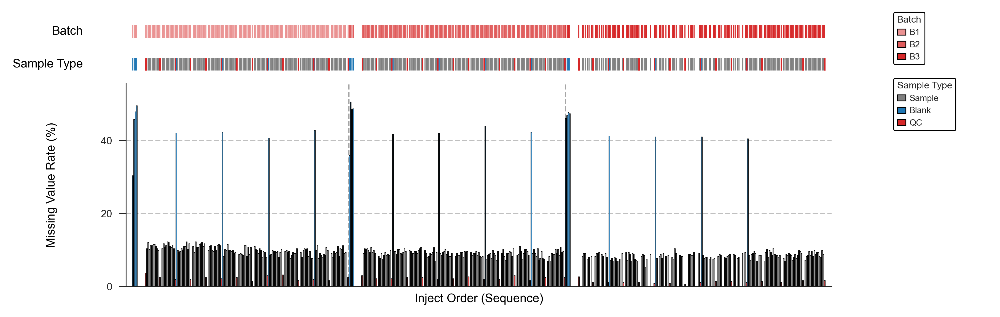

2026-09-09 12:57:37.658 | INFO     | builder:_render_dataset_dashboard:535 - Global acquisition overview plot saved as: tutorial_output\01_Raw_Data\Global_Acquisition_Overview.svg
2026-09-09 12:57:37.658 | SUCCESS  | timing:wrapped:27 - Execution time of "run_build": 1.492 seconds.


In [3]:
# Construct the dataset and retain its typed Audit for final reporting.
step1_dir = os.path.join(OUTPUT_DIR, "01_Raw_Data")
dataset_builder = MetaboDatasetBuilder(
    meta_info=meta_df,
    int_df=int_df,
    pipeline_params=params,
)
raw_result = dataset_builder.run_build(output_dir=step1_dir)
raw_dataset = raw_result.data

### QA-Step 01: Quality Assessment of Raw Data

Establish the unprocessed reference using QC-sample correlation, batch-level QC correlation where applicable, QC and study-sample RSD distributions, PCA structure, and multivariate outlier diagnostics. Internal standards and outlier-reference features are included only when they are present and valid in the dataset context.

`qa_raw_result.data` contains the assessment diagnostics, while `qa_raw_result.audit` contains serializable metrics, tables, flags, and the `AssessmentPlotPayload` used for later cross-stage rendering. Retaining the Audit avoids recalculating PCA, distances, or outlier statistics during report compilation.

2026-09-09 12:57:37.895 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_01_Raw_Data


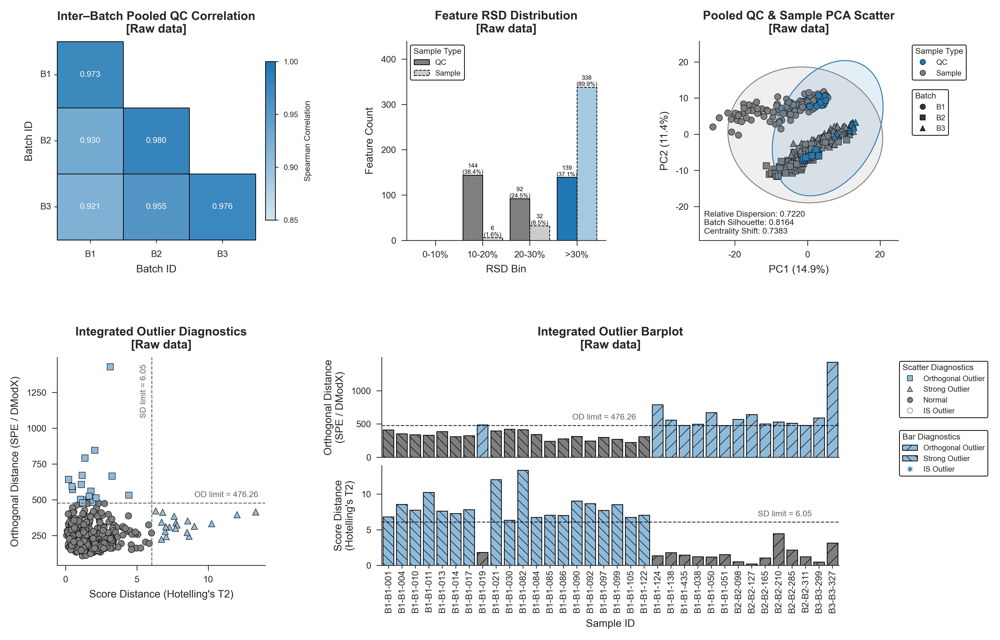

2026-09-09 12:57:46.082 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_01_Raw_Data\QA_Summary_Dashboard.svg
2026-09-09 12:57:46.082 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 12:57:46.083 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 8.320 seconds.


In [4]:
# Retain the baseline Audit for the final cross-stage QA comparison.
qa_raw_engine = QualityAssessor(raw_dataset, pipeline_params=params)
qa_raw_result = qa_raw_engine.run_assessment(
    output_dir=os.path.join(OUTPUT_DIR, "QA_01_Raw_Data")
)

## Step 02: Missing-Value Filtering

Run two explicit but dependent filtering actions. First, screen QC and Actual samples by their missing-value proportion while preserving Blank and other non-target sample roles. Second, calculate global, QC, and biological-group missingness on the retained sample matrix, then route features through MAR eligibility, group/QC MNAR rescue, or exclusion.

The sample and feature actions return independent `StageResult` and Audit objects even though their CSV tables and combined dashboard share `02_MV_Filtered`. `mv_filter_result.audit.feature_tracking` is the authoritative record of retained, rescued, and excluded features and is deliberately reused by quality filtering and imputation.

2026-09-09 12:57:46.120 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\02_MV_Filtered


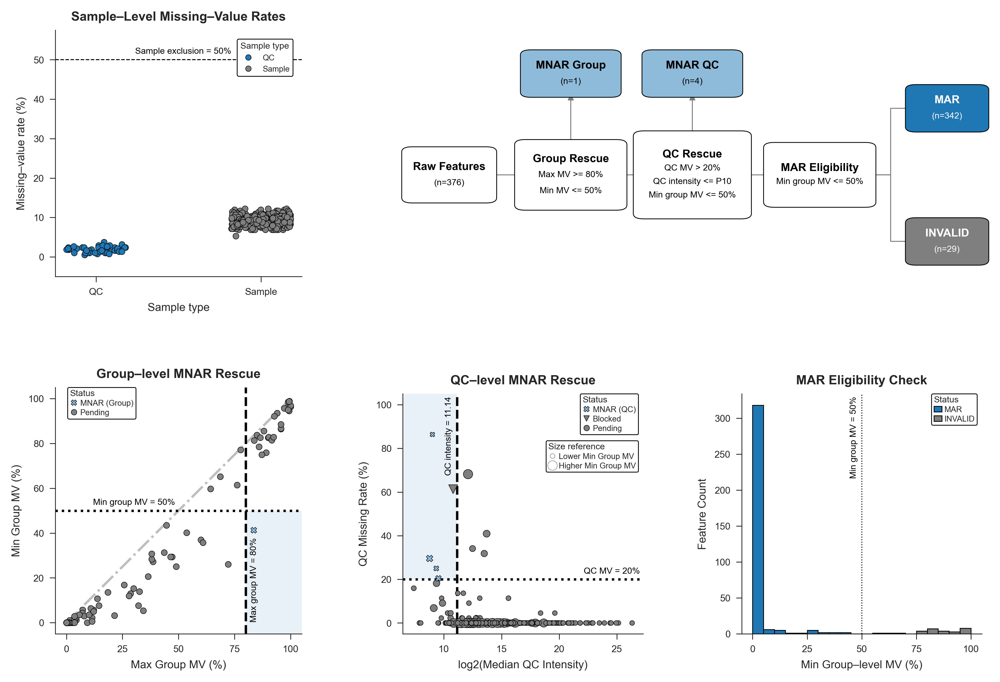

2026-09-09 12:57:49.158 | INFO     | runner:render:147 - MV classification dashboard saved as: tutorial_output\02_MV_Filtered\MV_Classification_Dashboard.svg
2026-09-09 12:57:49.158 | SUCCESS  | runner:render:148 - Feature missing-value filtering completed.
2026-09-09 12:57:49.159 | SUCCESS  | timing:wrapped:27 - Execution time of "run_filter_features_by_missingness": 2.958 seconds.


In [5]:
# The two actions share an artifact directory but return separate Audits.
missingness_output_dir = os.path.join(OUTPUT_DIR, "02_MV_Filtered")

sample_mv_engine = SampleMissingValueFilter(
    raw_dataset,
    pipeline_params=params,
)
sample_mv_result = sample_mv_engine.run_filter_samples_by_missingness(
    output_dir=missingness_output_dir
)

feature_mv_engine = FeatureMissingValueFilter(
    sample_mv_result.data,
    pipeline_params=params,
    sample_result=sample_mv_result,
)
mv_filter_result = feature_mv_engine.run_filter_features_by_missingness(
    output_dir=missingness_output_dir
)
mv_filter_dataset = mv_filter_result.data

### QA-Step 02: Quality Assessment after Missing-Value Filtering

Recompute the fixed QA suite for the high-missingness-filtered matrix and compare it with the raw baseline. Changes in QC consistency, RSD distributions, PCA geometry, outliers, and reference-feature behavior should be interpreted together with the preceding sample/feature tracking tables; the QA Audit observes the matrix but does not replace the filtering Audit.

2026-09-09 12:57:49.320 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_02_MV_Filtered


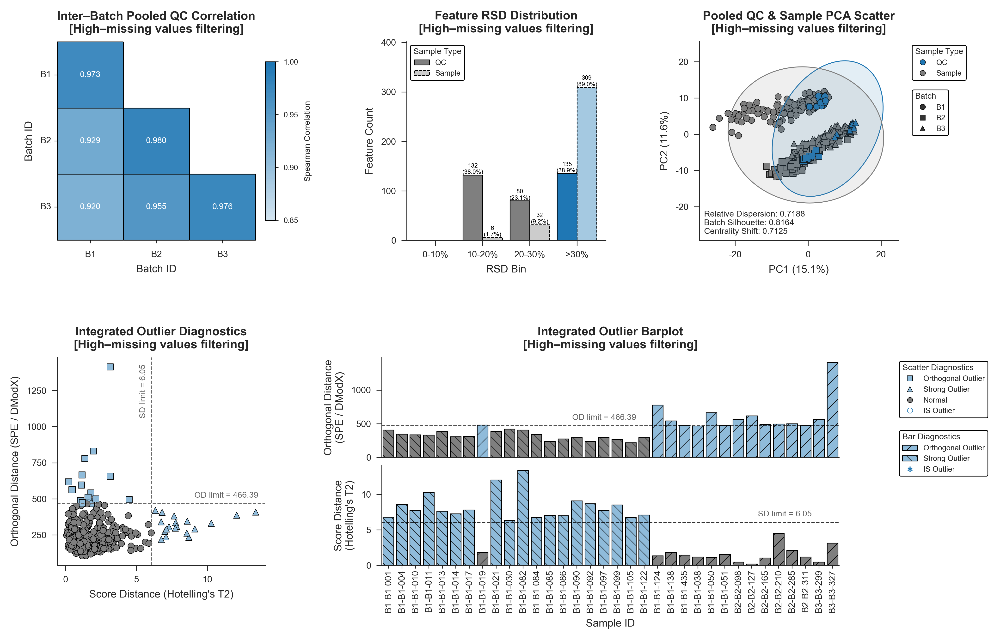

2026-09-09 12:57:58.397 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_02_MV_Filtered\QA_Summary_Dashboard.svg
2026-09-09 12:57:58.398 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 12:57:58.398 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 9.207 seconds.


In [6]:
# QA observes the retained matrix; filtering decisions stay in its Audit.
qa_mv_engine = QualityAssessor(mv_filter_dataset, pipeline_params=params)
qa_mv_result = qa_mv_engine.run_assessment(
    output_dir=os.path.join(OUTPUT_DIR, "QA_02_MV_Filtered")
)

## Step 03: Signal Drift and Batch-Effect Correction

Correct injection-order drift and batch effects using pooled QCs and the selected correction family. With `base_est="Auto"`, the core evaluates supported candidates using QC-RSD performance, relevant out-of-fold evidence, and a study-sample structure-preservation guardrail before selecting a method.

`correction_result.data` is an ordered mapping because some selected methods produce both intra-batch and inter-batch datasets. Only those scientifically propagated stages cross the data boundary; candidate scores and selected predictions are retained once in `correction_result.audit.plot_payload`. The final mapping value becomes the input to quality filtering.

2026-09-09 12:57:58.436 | INFO     | analysis:transform_correction:751 - Blank policy: 24 Blank samples are excluded from model fitting where supported and retained as frozen-model corrections in output.
2026-09-09 12:57:58.437 | INFO     | analysis:transform_correction:782 - AUTO mode enabled. Evaluating multiple methods.
2026-09-09 12:57:58.437 | INFO     | analysis:_evaluate_correction_candidates:372 - --- Evaluating Method: SERRF ---
2026-09-09 12:57:58.439 | INFO     | analysis:_prepare_serrf_correlation_matrix:305 - Calculating Spearman correlation on features...
2026-09-09 12:57:58.441 | INFO     | serrf:fit_transform:171 - Initializing High-Performance Hybrid SERRF Corrector...


SERRF: 100%|█████████████████████████████████████████████████████████████████████| 347/347 [Elapsed: 00:14 | ETA: 00:00]

2026-09-09 12:58:12.716 | INFO     | analysis:_evaluate_correction_candidates:657 - SERRF Eval QC RSD: 10.15%
2026-09-09 12:58:12.717 | INFO     | analysis:_evaluate_correction_candidates:372 - --- Evaluating Method: RUV-III ---
2026-09-09 12:58:12.722 | INFO     | analysis:_prepare_ruv_control_features:346 - RUV-III Control Features: 20 total (5 predefined, 17 empirical).
2026-09-09 12:58:12.722 | INFO     | ruv:fit_transform:49 - Executing RUV-III (k=5)...
2026-09-09 12:58:12.725 | WARNING  | ruv:fit_transform:75 - NaNs detected. Applying non-Blank median imputation...


2026-09-09 12:58:13.278 | INFO     | analysis:_evaluate_correction_candidates:657 - RUV-III Eval QC RSD: 11.09%
2026-09-09 12:58:13.279 | INFO     | analysis:_evaluate_correction_candidates:372 - --- Evaluating Method: WaveICA 2.0 ---
2026-09-09 12:58:13.279 | INFO     | waveica:fit_transform:504 - Executing WaveICA 2.0 correction...
2026-09-09 12:58:13.759 | INFO     | waveica:fit_transform:562 - WaveICA 2.0 Blank policy: 24 Blank samples received frozen artifact predictions (4172 proxy fallback cells; 204 source boundary fallbacks).
2026-09-09 12:58:13.911 | INFO     | analysis:_evaluate_correction_candidates:657 - WaveICA 2.0 Eval QC RSD: 18.56%
2026-09-09 12:58:13.912 | INFO     | analysis:_evaluate_correction_candidates:372 - --- Evaluating Method: QC-RLSC ---
2026-09-09 12:58:13.912 | INFO     | regression:fit_transform:79 - Phase 1: Executing Intra-batch drift correction with QC-RLSC...
2026-09-09 12:58:19.668 | INFO     | regression:fit_transform:287 - Phase 2: Executing Inter-

SC [B3]: 100%|███████████████████████████████████████████████████████████████████| 347/347 [Elapsed: 00:00 | ETA: 00:00]

2026-09-09 12:58:21.460 | INFO     | regression:fit_transform:287 - Phase 2: Executing Inter-batch median alignment...


2026-09-09 12:58:21.729 | INFO     | analysis:_evaluate_correction_candidates:657 - QC-SVR Eval QC RSD: 13.83%
2026-09-09 12:58:21.731 | SUCCESS  | analysis:transform_correction:842 - Auto selection: SERRF is optimal (score = 0.663, Eval QC RSD = 10.15%).
2026-09-09 12:58:21.747 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\03_Corrected_Data
2026-09-09 12:58:21.847 | INFO     | runner:render:76 - Assembling correction diagnostic dashboard...


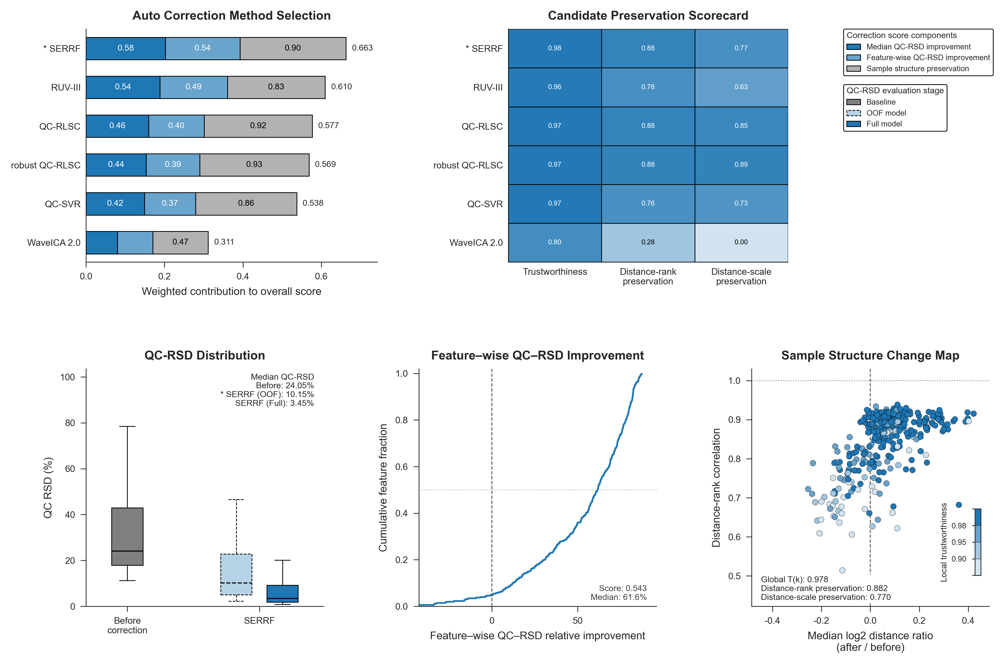

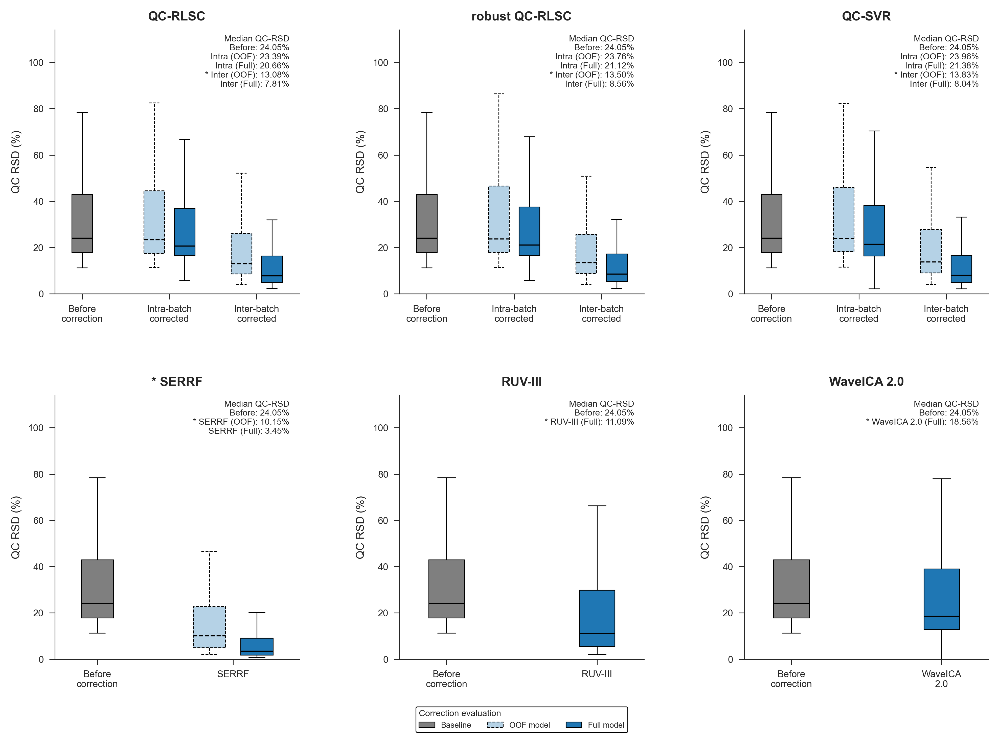

2026-09-09 12:58:44.293 | INFO     | runner:render:108 - Correction candidate dashboard saved as: tutorial_output\03_Corrected_Data\Correction_Candidate_Dashboard_SERRF.svg
2026-09-09 12:58:44.299 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\03_Corrected_Data\Internal_Standard_Scatters
2026-09-09 12:58:44.300 | INFO     | runner:_render_internal_standards:147 - Generating IS plots for SERRF...
2026-09-09 12:58:47.857 | INFO     | runner:_render_internal_standards:168 - Bypassing IS baseline prediction for SERRF.
2026-09-09 12:58:47.858 | SUCCESS  | runner:render:112 - Signal drift correction (SERRF) completed.
2026-09-09 12:58:47.859 | SUCCESS  | timing:wrapped:27 - Execution time of "run_signal_correction": 49.424 seconds.


In [7]:
# AUTO evidence and the selected prediction are stored in the Audit.
correction_engine = SignalCorrector(
    mv_filter_dataset,
    pipeline_params=params,
)
correction_result = correction_engine.run_signal_correction(
    output_dir=os.path.join(OUTPUT_DIR, "03_Corrected_Data")
)
corrected_stages = correction_result.data
corrected_dataset = list(corrected_stages.values())[-1]

### QA-Step 03: Quality Assessment of Corrected Stages

Assess every correction stage selected for propagation, rather than every candidate evaluated internally. For a multi-batch QC-anchored run this may include intra-batch and inter-batch corrected datasets; a global method may return one final stage. Each Audit is retained under its stage name so the final report can compare the same RSD, PCA, correlation, and outlier diagnostic across stages.

2026-09-09 12:58:48.070 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_03_Corrected_Data\SERRF


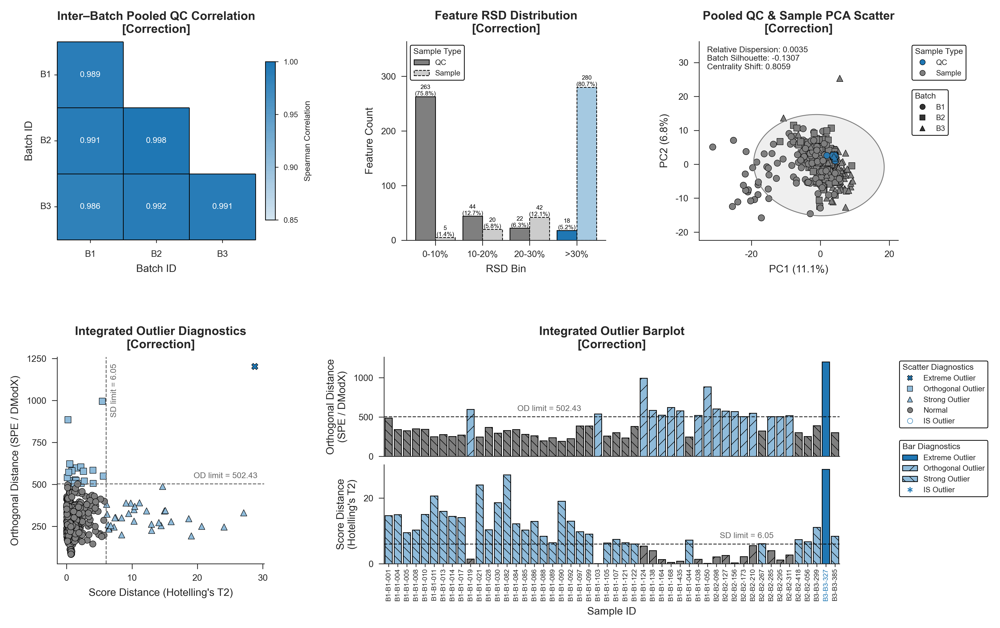

2026-09-09 12:58:58.074 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_03_Corrected_Data\SERRF\QA_Summary_Dashboard.svg
2026-09-09 12:58:58.075 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 12:58:58.076 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 10.167 seconds.


In [8]:
# Some methods propagate more than one scientifically meaningful stage.
qa_correction_results = {}
for stage_name, stage_dataset in corrected_stages.items():
    safe_name = re.sub(r"[^A-Za-z0-9_-]+", "_", stage_name).strip("_")
    assessor = QualityAssessor(stage_dataset, pipeline_params=params)
    qa_correction_results[stage_name] = assessor.run_assessment(
        output_dir=os.path.join(
            OUTPUT_DIR, "QA_03_Corrected_Data", safe_name
        )
    )

## Step 04: Low-Quality Feature Filtering

Remove background-dominated features whose mean Blank/QC ratio exceeds the configured tolerance, then remove technically irreproducible MAR features using pooled-QC RSD. Features classified as MNAR in Step 02 remain exempt from the RSD rule because biological sparsity should not be treated as technical variation.

The complete Step 02 tracking table is supplied explicitly so `QualityFilterAuditPayload` can preserve the original feature denominator, cumulative retention counts, and final removal reasons. The filtered dataset alone does not contain enough information to reconstruct that history.

2026-09-09 12:58:58.110 | INFO     | analysis:filter_features_by_quality:947 - Features before filtering: 347
2026-09-09 12:58:58.113 | INFO     | analysis:filter_features_by_quality:965 - Features after Blank/QC check: 268
2026-09-09 12:58:58.116 | INFO     | analysis:filter_features_by_quality:992 - Features after QC RSD check: 256
2026-09-09 12:58:58.128 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\04_Quality_Filtered
2026-09-09 12:58:58.201 | INFO     | runner:export:211 - Data after low-quality features filtering saved as: tutorial_output\04_Quality_Filtered\Filtered_Data_Low-quality_Features.csv


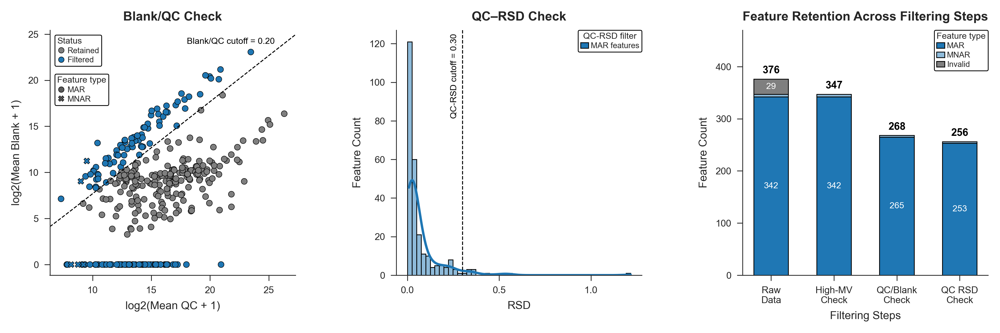

2026-09-09 12:59:05.792 | INFO     | runner:render:230 - Low-quality Filter summary dashboard saved as: tutorial_output\04_Quality_Filtered\Low-quality_Filtering_Dashboard.svg
2026-09-09 12:59:05.793 | SUCCESS  | runner:render:238 - Low-quality features filtering completed.
2026-09-09 12:59:05.793 | SUCCESS  | timing:wrapped:27 - Execution time of "run_filter_features_by_quality": 7.685 seconds.


In [9]:
# Supply the complete upstream tracking table to preserve provenance.
quality_filter_engine = FeatureQualityFilter(
    corrected_dataset,
    pipeline_params=params,
    missingness_metadata=mv_filter_result.audit.feature_tracking,
)
quality_filter_result = quality_filter_engine.run_filter_features_by_quality(
    output_dir=os.path.join(OUTPUT_DIR, "04_Quality_Filtered")
)
quality_filtered_dataset = quality_filter_result.data

### QA-Step 04: Quality Assessment after Low-Quality Filtering

Check whether Blank/QC and pooled-QC-RSD removal improved analytical consistency without distorting sample-level PCA geometry or unexpectedly changing outlier and reference-feature behavior. Feature decisions remain in the quality-filter Audit; this QA checkpoint records only the condition of the retained matrix.

2026-09-09 12:59:05.931 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_04_Quality_Filtered


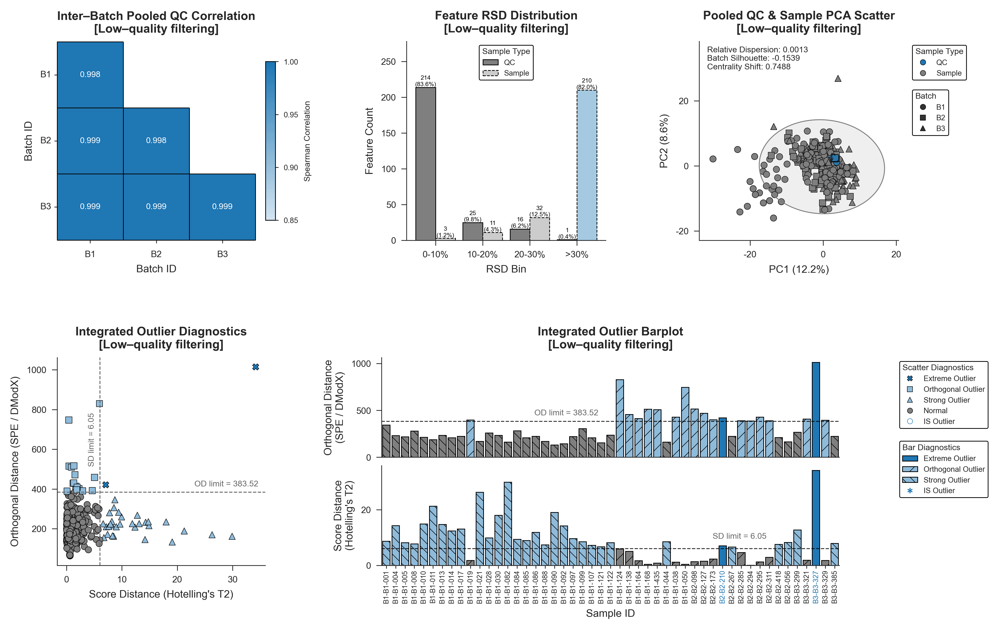

2026-09-09 12:59:15.808 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_04_Quality_Filtered\QA_Summary_Dashboard.svg
2026-09-09 12:59:15.809 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 12:59:15.810 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 9.985 seconds.


In [10]:
# Keep processing decisions separate from observational QA diagnostics.
qa_quality_filter_engine = QualityAssessor(
    quality_filtered_dataset,
    pipeline_params=params,
)
qa_quality_filter_result = qa_quality_filter_engine.run_assessment(
    output_dir=os.path.join(OUTPUT_DIR, "QA_04_Quality_Filtered")
)

## Step 05: Missing-Value Imputation

Use the retained MAR/MNAR classifications to apply separate imputation routes to non-Blank samples. MNAR features use QRILC or the configured LOD-fraction strategy; MAR features use the selected KNN, LLS, BPCA, MinProb, Median, or AUTO route. AUTO evaluates masked reconstruction error, low-intensity behavior, distribution fidelity, and sample-structure preservation.

Blank columns are preserved without imputation. If target samples contain no missing values, the stage returns a typed skipped Audit and propagates the matrix unchanged. The final-data structure diagnostics are separate from the masked candidate benchmark stored in the imputation Audit.

2026-09-09 12:59:15.850 | INFO     | analysis:transform_imputation:1489 - Hybrid Imputation Engine Initialized. MAR: Auto (Evaluating KNN=5, LLS (K=15), BPCA (PCs=2), MinProb, Median) | MNAR: QRILC | Sim_Mask: 0.05
2026-09-09 12:59:15.853 | INFO     | analysis:transform_imputation:1505 - Applying QRILC to 3 MNAR features.
2026-09-09 12:59:16.759 | INFO     | analysis:_select_best_imputation_method:1181 - Simulating "KNN" on MAR subset...
2026-09-09 12:59:17.164 | INFO     | analysis:_select_best_imputation_method:1181 - Simulating "MinProb" on MAR subset...
2026-09-09 12:59:17.658 | INFO     | analysis:_select_best_imputation_method:1181 - Simulating "QRILC" on MAR subset...
2026-09-09 12:59:18.205 | INFO     | analysis:_select_best_imputation_method:1181 - Simulating "Median" on MAR subset...
2026-09-09 12:59:18.629 | INFO     | analysis:_select_best_imputation_method:1181 - Simulating "LLS" on MAR subset...
2026-09-09 12:59:19.016 | INFO     | analysis:_select_best_imputation_method:

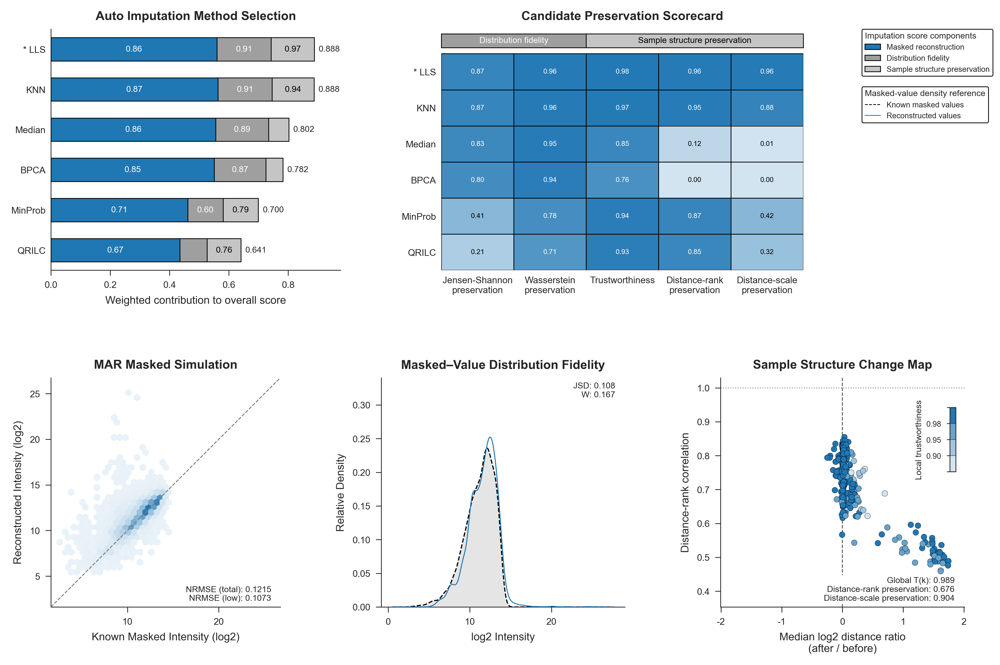

2026-09-09 12:59:37.600 | INFO     | runner:render:72 - Imputation dashboard saved as: tutorial_output\05_Imputation\Imputation_Dashboard_LLS.svg


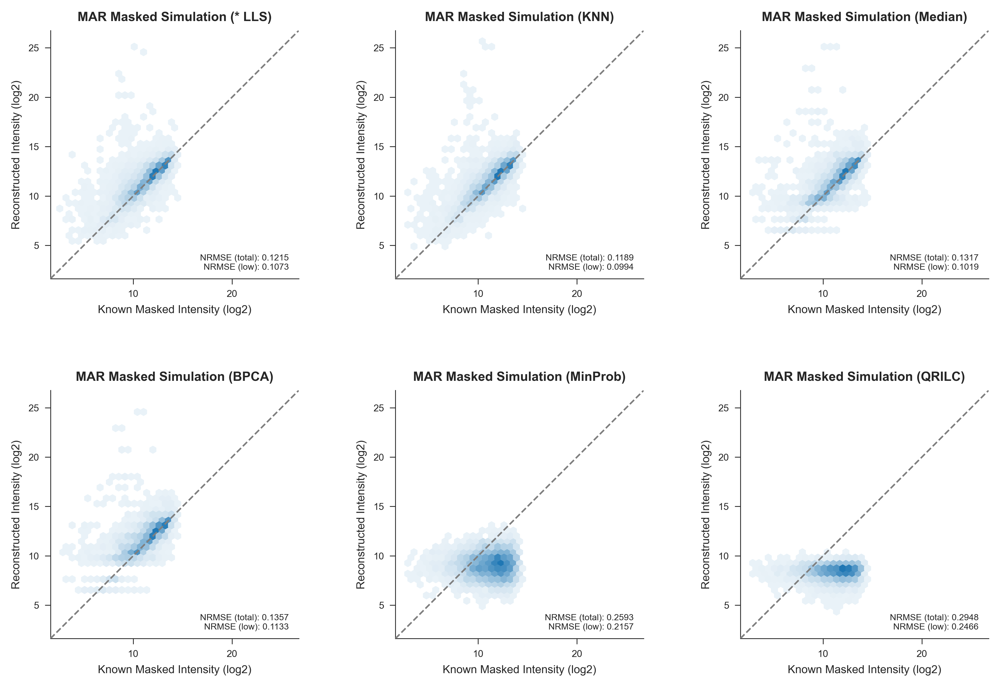

2026-09-09 12:59:40.861 | INFO     | runner:render:91 - Imputer candidate NRMSE grid saved as: tutorial_output\05_Imputation\Imputation_Candidate_Dashboard_LLS.svg
2026-09-09 12:59:40.861 | SUCCESS  | analysis:run_imputation:1731 - Missing value imputation completed successfully.
2026-09-09 12:59:40.862 | SUCCESS  | timing:wrapped:27 - Execution time of "run_imputation": 25.015 seconds.


In [11]:
# The stage may return a typed skipped Audit when no values need filling.
imputation_engine = MissingValueImputer(
    quality_filtered_dataset,
    pipeline_params=params,
)
imputation_result = imputation_engine.run_imputation(
    output_dir=os.path.join(OUTPUT_DIR, "05_Imputation"),
)
imputed_dataset = imputation_result.data

### QA-Step 05: Quality Assessment of Imputed Data

Re-evaluate QC consistency, RSD, PCA geometry, multivariate outliers, and reference-feature behavior after missing values are completed. The `ImputationAuditPayload` remains the authoritative record of the selected method and masked reconstruction evidence; the assessment Audit supports comparison with other pipeline stages.

2026-09-09 12:59:40.944 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_05_Imputed_Data


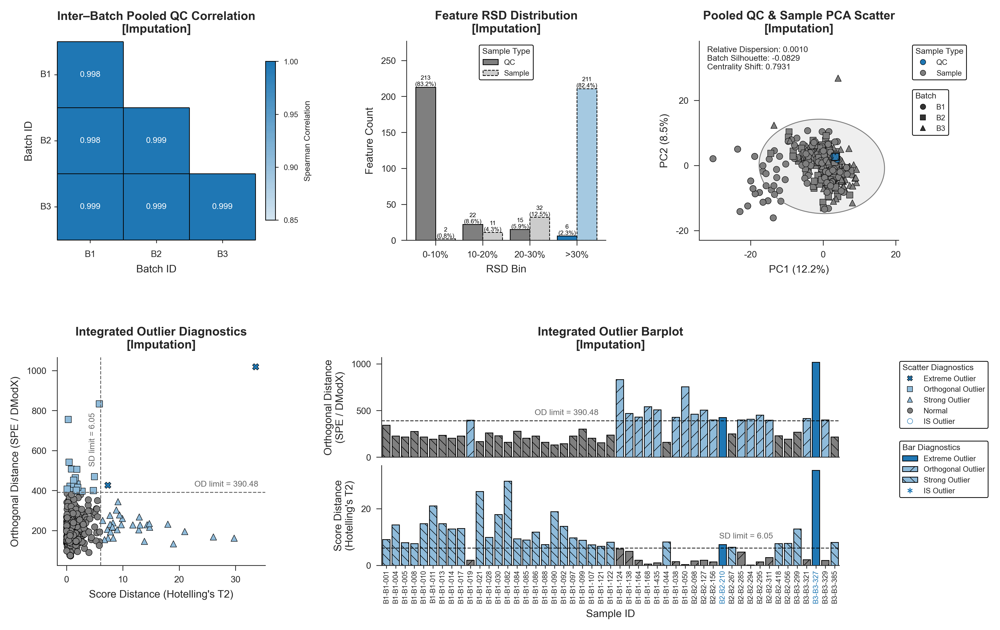

2026-09-09 12:59:50.858 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_05_Imputed_Data\QA_Summary_Dashboard.svg
2026-09-09 12:59:50.859 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 12:59:50.860 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 9.964 seconds.


In [12]:
# Assess the final imputed matrix, not the masked candidate benchmark.
qa_imputation_engine = QualityAssessor(
    imputed_dataset,
    pipeline_params=params,
)
qa_imputation_result = qa_imputation_engine.run_assessment(
    output_dir=os.path.join(OUTPUT_DIR, "QA_05_Imputed_Data")
)

## Step 06: Data Normalization

Normalize the imputed intensities using robust-log-only, TIC, Median, PQN, MDFC, Quantile, VSN, or the AUTO strategy configured by `norm_method="Auto"`. AUTO compares QC relative-log-expression alignment, variance stabilization, QC structure, and study-sample structure preservation before selecting a conservative candidate.

Blank samples are permanently removed from the normalized output. `NormalizationAuditPayload` stores the selected-method passport, candidate summaries, before/after QC diagnostics, and final sample-structure diagnostics. The returned `MetaboDataset.context` explicitly records the normalization stage and whether the matrix is already log-like.

2026-09-09 12:59:50.898 | INFO     | runner:compute:35 - Permanently dropping 24 Blank samples.
2026-09-09 12:59:50.899 | INFO     | runner:compute:36 - Applying Normalization | Method: Auto
2026-09-09 12:59:50.902 | INFO     | analysis:_select_auto_normalization:1231 - Auto normalization evaluates fixed strategies on a common log-like view using QC RLE, QC variance stabilization, QC structure, and sample structure criteria.
2026-09-09 12:59:50.903 | INFO     | analysis:_select_auto_normalization:1243 - Evaluating Auto normalization candidate: ROBUST_LOG_ONLY (log_transform=True).
2026-09-09 12:59:51.110 | INFO     | analysis:_select_auto_normalization:1243 - Evaluating Auto normalization candidate: TIC (log_transform=True).
2026-09-09 12:59:51.331 | INFO     | analysis:_select_auto_normalization:1243 - Evaluating Auto normalization candidate: MEDIAN (log_transform=True).
2026-09-09 12:59:51.543 | INFO     | analysis:_select_auto_normalization:1243 - Evaluating Auto normalization candi

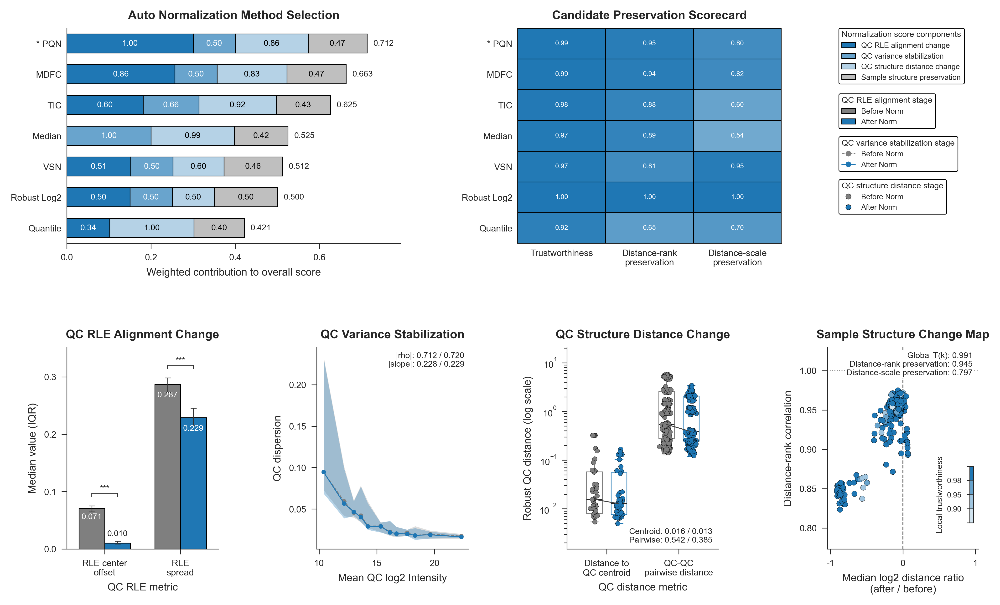

2026-09-09 13:00:26.254 | INFO     | runner:render:164 - Normalization summary dashboard saved as: tutorial_output\06_Normalized_Data\Normalization_Dashboard_PQN_Log2.svg
2026-09-09 13:00:26.255 | SUCCESS  | analysis:run_normalization:1441 - Data normalization completed successfully.
2026-09-09 13:00:26.255 | SUCCESS  | timing:wrapped:27 - Execution time of "run_normalization": 35.358 seconds.


In [13]:
# The output context records the selected transformation and log state.
normalization_engine = DataNormalizer(
    imputed_dataset,
    pipeline_params=params,
)
normalization_result = normalization_engine.run_normalization(
    output_dir=os.path.join(OUTPUT_DIR, "06_Normalized_Data"),
)
normalized_dataset = normalization_result.data

### QA-Step 06: Quality Assessment of Normalized Data

Create the final QA checkpoint using the normalized dataset's explicit `ProcessingContext`. Scale-sensitive QA therefore knows whether the matrix is already log-like and avoids applying an unintended second transformation. Interpret improvements in RSD and QC/batch correlation together with PCA geometry, outlier status, and the normalization Audit's preservation diagnostics.

2026-09-09 13:00:26.358 | INFO     | filesystem:ensure_directory:18 - Creating output directory: tutorial_output\QA_06_Normalized_Data


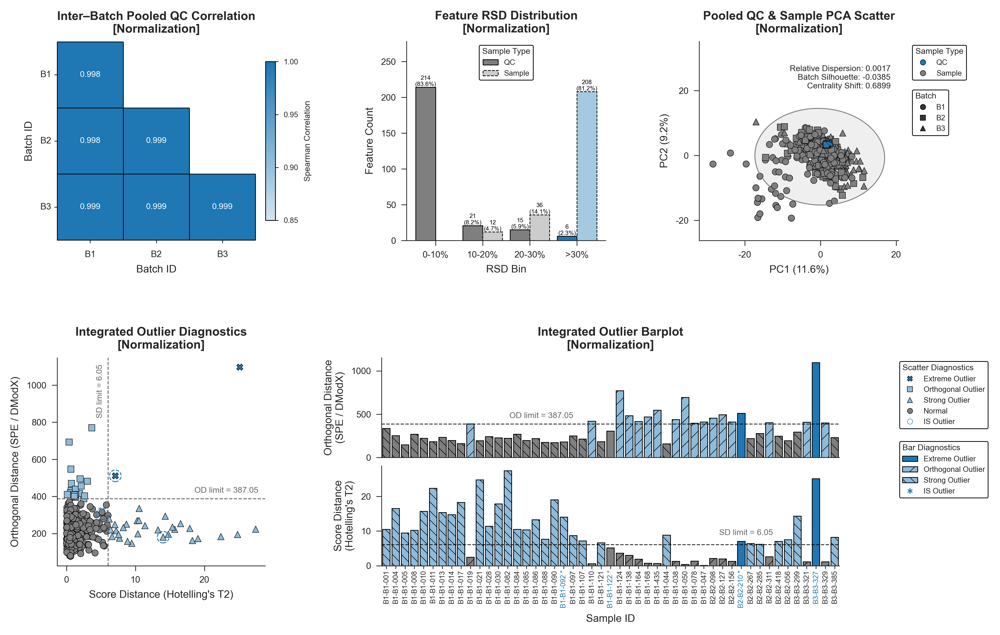

2026-09-09 13:00:36.088 | INFO     | rendering:render_assessment:259 - Assessor summary dashboard saved as: tutorial_output\QA_06_Normalized_Data\QA_Summary_Dashboard.svg
2026-09-09 13:00:36.089 | SUCCESS  | rendering:render_assessment:260 - Data quality assessment completed.
2026-09-09 13:00:36.089 | SUCCESS  | timing:wrapped:27 - Execution time of "run_assessment": 9.796 seconds.


In [14]:
# QualityAssessor reads the explicit normalized-data context.
qa_normalization_engine = QualityAssessor(
    normalized_dataset,
    pipeline_params=params,
)
qa_normalization_result = qa_normalization_engine.run_assessment(
    output_dir=os.path.join(OUTPUT_DIR, "QA_06_Normalized_Data")
)

## Step 07: Sequential Audit Report Compilation

Collect processing metrics, correction-stage metrics, and saved assessment Audits in the same scientific order used above. The visual reporter draws four cross-stage patchworklib dashboards—RSD, PCA, correlation, and outliers—directly from Audit payloads. Each dashboard uses one shared legend brick, consistent batch styles, and the complete applicable IS/ORF legend without reading or stitching intermediate SVG panels.

`ReportInput` records the package version, acquisition mode, batch design, validated configuration, metrics, and asset manifest used for the narrative. The reporter writes comprehensive and brief Markdown reports plus a JSON snapshot. PDF export is optional and is attempted only when `EXPORT_PDF` is true and the required rendering engine is available.

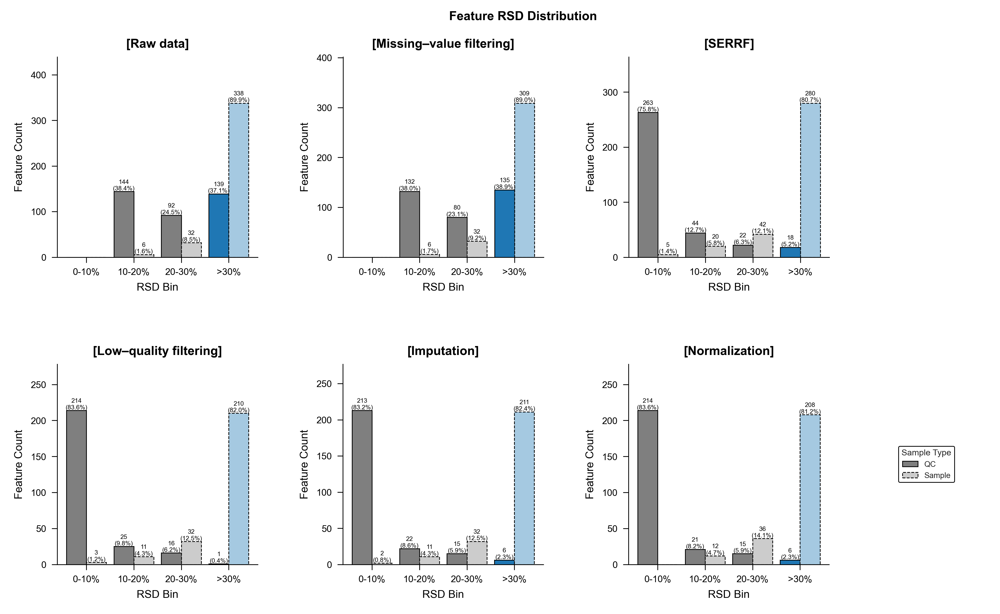

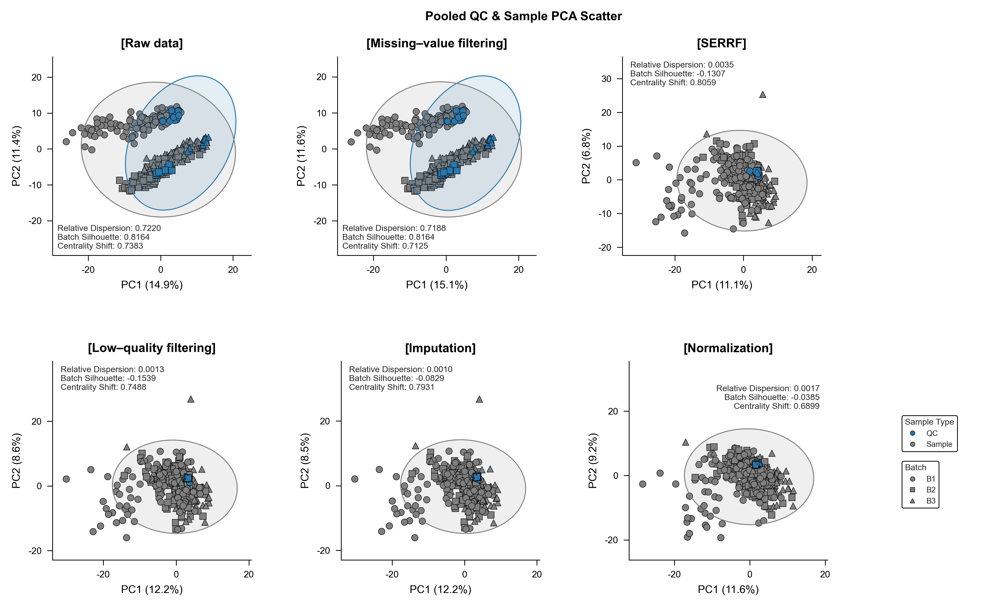

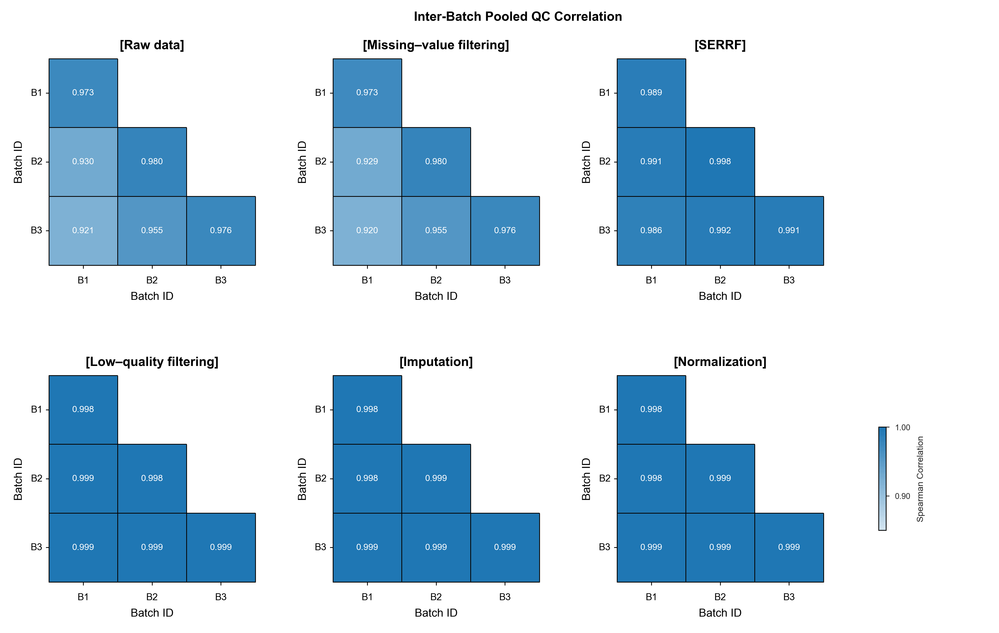

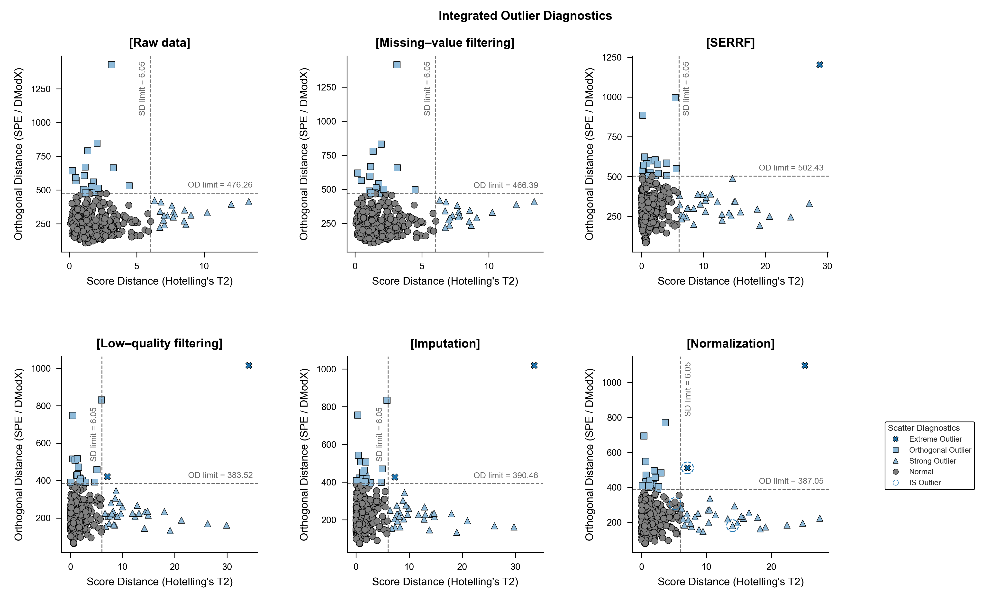

2026-09-09 13:00:48.064 | INFO     | utils:generate_markdown:1185 - Generating COMPREHENSIVE narrative report...
2026-09-09 13:00:48.114 | SUCCESS  | utils:generate_markdown:1195 - Comprehensive report generated: tutorial_output\07_Report_Summary\Report_Comprehensive.md
2026-09-09 13:00:48.115 | INFO     | utils:generate_markdown:1185 - Generating BRIEF narrative report...
2026-09-09 13:00:48.133 | SUCCESS  | utils:generate_markdown:1195 - Brief report generated: tutorial_output\07_Report_Summary\Report_Brief.md
2026-09-09 13:00:48.255 | INFO     | utils:export_report:1368 - --- Exporting PDF for: Report_Comprehensive.md ---
2026-09-09 13:00:48.256 | INFO     | utils:_render_weasyprint:1285 - Attempting PDF export via WeasyPrint...
2026-09-09 13:00:54.576 | SUCCESS  | utils:_render_weasyprint:1311 - PDF generated: tutorial_output\07_Report_Summary\Report_Comprehensive.pdf
2026-09-09 13:00:54.577 | SUCCESS  | utils:export_report:1396 - [Report_Comprehensive.md] completed using WeasyPrin

In [15]:
REPORT_DIR = "07_Report_Summary"

stage_results = {
    "raw_dataset": raw_result,
    "sample_missing_value_filtering": sample_mv_result,
    "high_mv_feature_filtering": mv_filter_result,
    "signal_correction": correction_result,
    "low_quality_feature_filtering": quality_filter_result,
    "missing_value_imputation": imputation_result,
    "normalization": normalization_result,
}
pipeline_metrics = {
    name: result.audit.metrics for name, result in stage_results.items()
}

qa_metrics = {
    "raw_dataset": qa_raw_result.audit.metrics,
    "high_mv_feature_filtering": qa_mv_result.audit.metrics,
    "low_quality_feature_filtering": qa_quality_filter_result.audit.metrics,
    "missing_value_imputation": qa_imputation_result.audit.metrics,
    "normalization": qa_normalization_result.audit.metrics,
}
correction_metric_keys = {
    "Intra-batch corrected": "intra_batch_correction",
    "Inter-batch corrected": "inter_batch_correction",
    "SERRF": "global_correction",
    "RUV-III": "global_correction",
    "WaveICA 2.0": "global_correction",
}
for stage_name, result in qa_correction_results.items():
    key = correction_metric_keys.get(stage_name, "unknown_correction")
    qa_metrics[key] = result.audit.metrics

# Keep QA checkpoints in processing order, including each correction stage.
qa_audits = {
    "Raw data": qa_raw_result.audit,
    "Missing-value filtering": qa_mv_result.audit,
    **{name: result.audit for name, result in qa_correction_results.items()},
    "Low-quality filtering": qa_quality_filter_result.audit,
    "Imputation": qa_imputation_result.audit,
    "Normalization": qa_normalization_result.audit,
}

asset_manifest = VisualAssetReporter(OUTPUT_DIR).compile_assessor_report(
    audits=qa_audits,
    is_multi_batch=raw_dataset.is_multi_batch,
    report_folder=REPORT_DIR,
)
report_input = ReportInput(
    pipeline_metrics=pipeline_metrics,
    qa_metrics=qa_metrics,
    metadata={
        "date": datetime.now().strftime("%Y-%m-%d %H:%M"),
        "version": pimqc.__version__,
        "mode": raw_dataset.context.acquisition_mode,
        "is_multi_batch": raw_dataset.is_multi_batch,
    },
    resolved_config=params,
    asset_manifest=asset_manifest,
)
reporter = NarrativeStatsReporter(OUTPUT_DIR)
reporter.generate_markdown(report_input, report_folder=REPORT_DIR)
if EXPORT_PDF:
    report_generated = reporter.export_report(pdf_engine="weasyprint")
    if not report_generated:
        raise RuntimeError(
            "Processing completed, but report export failed. "
            "Check the converter logs and installed dependencies."
        )


### Result

Use `normalized_dataset.intensity`, `normalized_dataset.sample_metadata`, and `normalized_dataset.feature_metadata` for downstream analysis. Inspect each processing `result.audit` for method selection, tracking, thresholds, warnings, and plot payloads; inspect the named QA Audits for cross-stage quality evidence. Persist `MetaboDataset` and typed Audit objects separately through `pimqc.serialization` when a workflow plugin, LLM skill, or later Python session needs a stable hand-off. See [the native API reference](../docs/native_api.md) for the complete contracts and additional examples.
